In [33]:
import pandas as pd
import yaml
from ipywidgets import interact, widgets

df = pd.read_csv('results.csv')
df.loc[df['score'] < 0,'score'] = 0

def get_no_reducer_score(dataset):
    with open(f'../TV_sb_no_reducer/scores/no_reducer_{dataset}.yaml') as f:
        score = yaml.load(f, Loader=yaml.FullLoader)
        score = score['score']
    return score


datasets = ['kuhar', 'motionsense', 'uci', 'wisdm', 'realworld_thigh']
score_no_reducer={}
for dataset in datasets:
   score_no_reducer[dataset] =get_no_reducer_score(dataset)
    
    


/tmp/ipykernel_169196/2345328744.py:5: DtypeWarning:

Columns (45,46,47) have mixed types. Specify dtype option on import or set low_memory=False.



In [13]:
#df.head

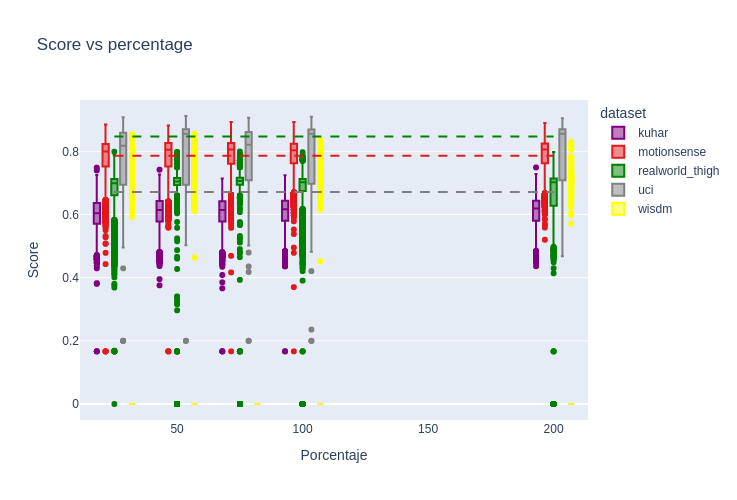

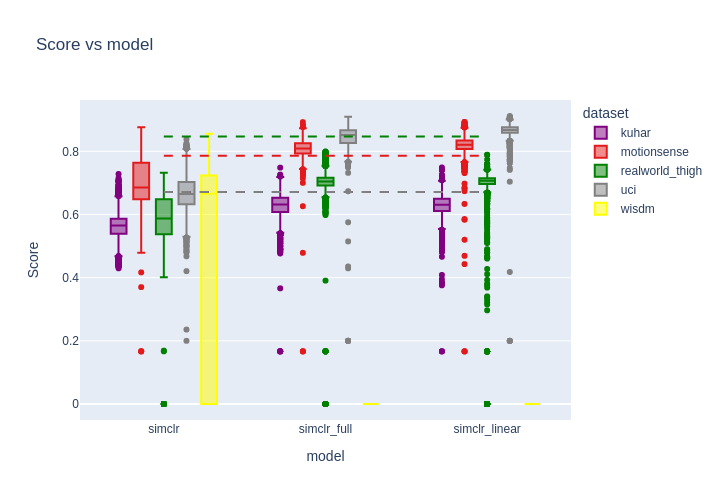

In [14]:
import seaborn as sns
import plotly.express as px
import pandas as pd
import plotly.graph_objects as go

lista_colores = ["purple", "#e31a1c", "green", "gray", "yellow","blue"]

def box_plot_datasets(df,x):
    dummy_fig = px.box(df.head(0), x=x, y='score', color='dataset', color_discrete_sequence=lista_colores)
    box_colors = [trace.marker.line.color for trace in dummy_fig.data]

    fig = px.box(df, x=x, y='score', color='dataset',
                 title=f'Score vs {x}',
                 labels={'score': 'Score', 'percentage': 'Porcentaje'},
                 color_discrete_sequence=lista_colores,  # Use custom colors
                 width=800, height=500)
    
    cdatasets = df['dataset'].unique()
    
    for dataset, color in zip(datasets, lista_colores):    
        fig.add_shape(
            go.layout.Shape(
                type="line",
                x0=df[x].min(),
                x1=df[x].max(),
                y0=score_no_reducer[dataset],
                y1=score_no_reducer[dataset],
                line=dict(color=color, width=2, dash='dash'),
            )
        )
    
    fig.show()

box_plot_datasets(df,'percentage')
box_plot_datasets(df,'model')

In [18]:
maximos_por_grupo = df.groupby(['dataset', 'percentage'])['score'].max()
maximos_por_grupo


dataset          percentage
kuhar            25            0.748357
                 50            0.741784
                 75            0.713615
                 100           0.723944
                 200           0.748826
motionsense      25            0.885238
                 50            0.881905
                 75            0.892857
                 100           0.892857
                 200           0.889762
realworld_thigh  25            0.798753
                 50            0.798186
                 75            0.799320
                 100           0.797052
                 200           0.797619
uci              25            0.907647
                 50            0.911765
                 75            0.906471
                 100           0.909412
                 200           0.905000
wisdm            25            0.853644
                 50            0.855508
                 75            0.000000
                 100           0.835847
            

In [19]:
maximos_por_grupo = df.groupby(['dataset', 'percentage','model'])['score'].max()
maximos_por_grupo

dataset  percentage  model        
kuhar    25          simclr           0.688967
                     simclr_full      0.748357
                     simclr_linear    0.739437
         50          simclr           0.706103
                     simclr_full      0.726291
                                        ...   
wisdm    100         simclr_full      0.000000
                     simclr_linear    0.000000
         200         simclr           0.829492
                     simclr_full      0.000000
                     simclr_linear    0.000000
Name: score, Length: 72, dtype: float64

In [66]:
idx_max = df.groupby(['dataset', 'percentage'])['score'].idxmax()
df_fmax_score = df.loc[idx_max]
#df_fmax_score

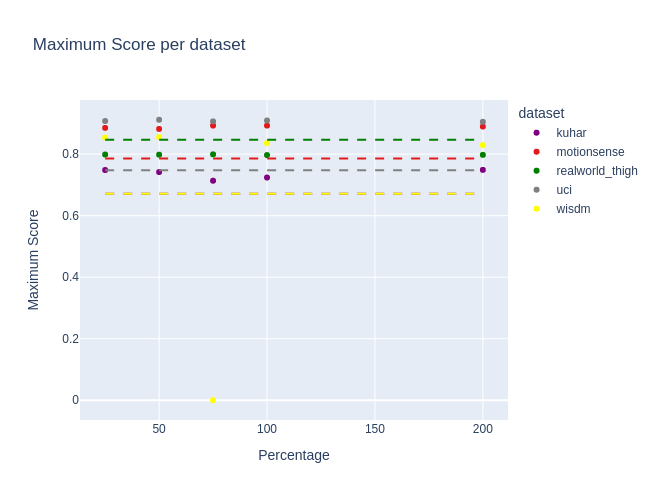

In [67]:
import pandas as pd
import plotly.express as px

lista_colores = ["purple", "#e31a1c", "green", "gray", "yellow", "blue"]
x='percentage'
fig = px.scatter(df_fmax_score, 
                 x='percentage', 
                 y='score', 
                 color='dataset', 
                 color_discrete_sequence=lista_colores,  
                 title='Maximum Score per dataset',
                 labels={'score': 'Maximum Score', 'percentage': 'Percentage'},
                 width=800, height=500)

for dataset, color in zip(datasets, lista_colores):    
        fig.add_shape(
            go.layout.Shape(
                type="line",
                x0=df[x].min(),
                x1=df[x].max(),
                y0=score_no_reducer[dataset],
                y1=score_no_reducer[dataset],
                line=dict(color=color, width=2, dash='dash'),
            )
        )

fig.show()


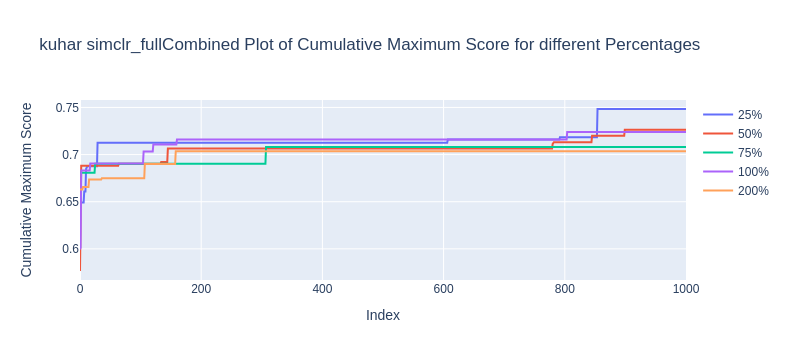

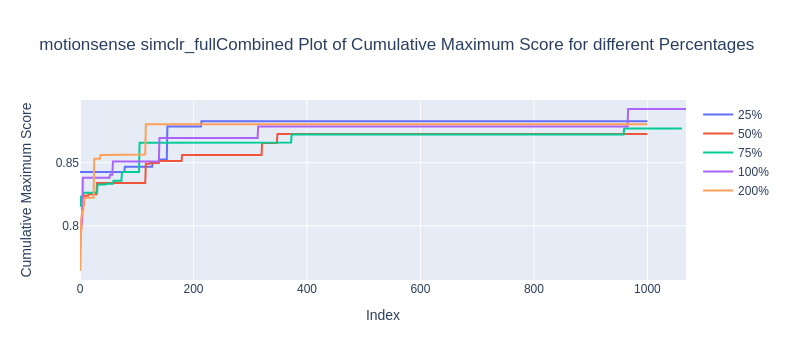

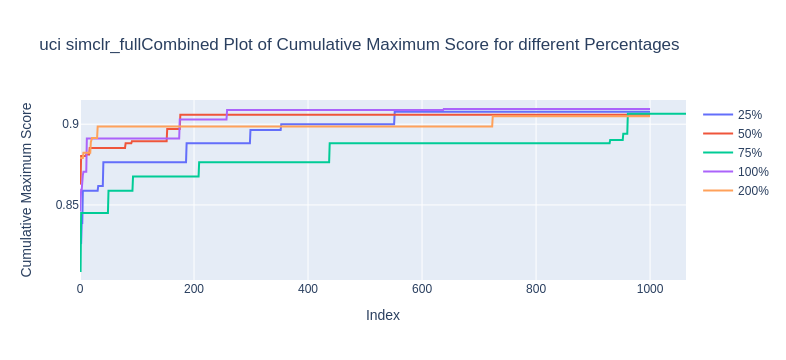

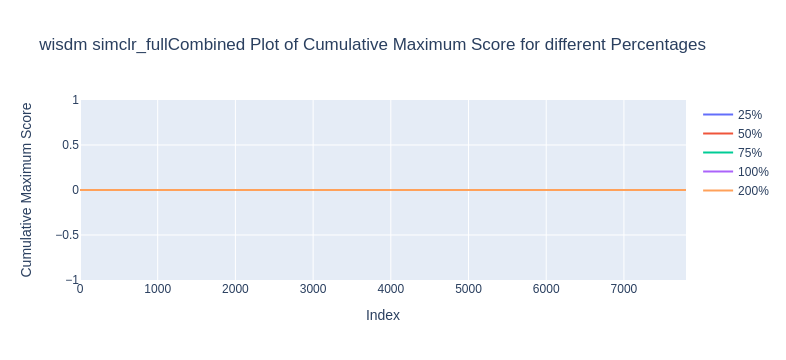

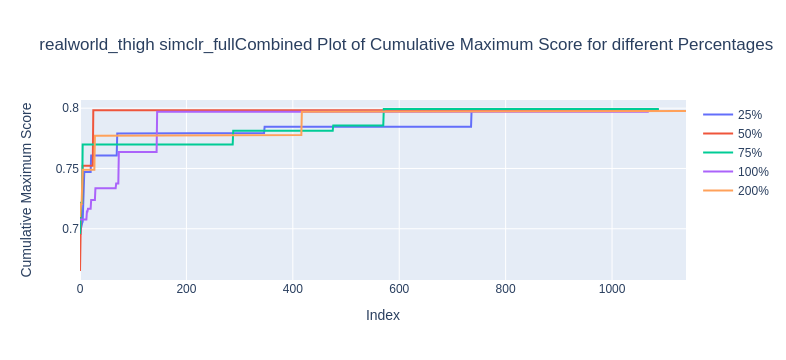

In [10]:
import pandas as pd
import plotly.graph_objects as go

# Assuming combined_data is your DataFrame
# Replace 'your_dataframe.csv' with the actual file path if loading from a CSV file
# combined_data = pd.read_csv('your_dataframe.csv')

def generate_combined_plot(dataset, percentage, model):
    data = df[(df['dataset'] == dataset) & 
                         (df['percentage'] == percentage) & 
                         (df['model'] == model) ]
    
    max_dataset_score = data['score'].cummax()
    trace = go.Scatter(x=list(range(len(max_dataset_score))), y=max_dataset_score, mode='lines', name=f'{percentage}%')
    
    return trace

def plot_by_dataset(dataset,model):
    fig = go.Figure()
    
    # Add each trace to the same Figure object
    fig.add_trace(generate_combined_plot(dataset, 25, model))
    fig.add_trace(generate_combined_plot(dataset, 50, model))
    fig.add_trace(generate_combined_plot(dataset, 75, model))
    fig.add_trace(generate_combined_plot(dataset, 100, model))
    fig.add_trace(generate_combined_plot(dataset, 200, model))
    
    fig.update_layout(
        xaxis_title='Index',
        yaxis_title='Cumulative Maximum Score',
        title=f'{dataset} {model}Combined Plot of Cumulative Maximum Score for different Percentages'
    )
    
    # Show the plot
    fig.show()
    
model='simclr_full'
for dataset in datasets:
    plot_by_dataset(dataset,model)

In [44]:
def update_hyperparameters_plot(dataset, type_simclr, percentage):
    data = df[(df['dataset'] == dataset) & 
                         (df['percentage'] == percentage) & 
                         (df['model'] == model) ]
    score_no_reducer=get_no_reducer_score(dataset)
    fig = px.scatter(data, x='Unnamed: 0', y='score', title=f'{dataset} - hyperparameters exploration', labels={'score': 'Scores'})
    fig.update_xaxes(title_text='', showticklabels=False)
    fig.update_yaxes(title_text='', showticklabels=False)
    fig.add_scatter(x=data['Unnamed: 0'], y=data['score'].cummax(), mode='lines', line=dict(color='blue', width=4), name='MAX (KNN, SVC, RF)')
    fig.add_scatter(x=data['Unnamed: 0'], y=[score_no_reducer] * len(data), mode='lines', line=dict(color='red', width=4), name='No reducer')
    fig.update_traces(marker=dict(size=4), selector=dict(mode='markers'))

    fig.show()

dataset_default='uci'
model_default='simclr_full'
models=['simclr','simclr_linear','simclr_full']
percentages = [25, 50, 75, 100, 200]
percentage_default=25
# Crear widget interactivo
interact(update_hyperparameters_plot, dataset=widgets.Dropdown(options=datasets, value=dataset_default), type_simclr=widgets.Dropdown(options=models, value=model_default), percentage=widgets.Dropdown(options=percentages, value=percentages[0]))


interactive(children=(Dropdown(description='dataset', index=2, options=('kuhar', 'motionsense', 'uci', 'wisdm'…

<function __main__.update_hyperparameters_plot(dataset, type_simclr, percentage)>

In [46]:
import plotly.express as px
import pandas as pd

configs=['latent_dim','temperature','batch_size']
def plot_config_paramenters(dataset,type_simclr,config_val,percentage):
    data = df[(df['dataset'] == dataset) & 
                         (df['percentage'] == percentage) & 
                         (df['model'] == model) ]
    
    score_no_reducer=get_no_reducer_score(dataset)  
    if type_simclr == 'simclr':
        print("fo")
        if config_val=='temperature':
            print('ok3')
            config_val='temperature'
    print(config_val)
    x=f'config/{config_val}'
    y='score'
    fig = px.box(data, x=x, y=y)
    fig.update_layout(xaxis_title=x,yaxis_title=y,
            title=f'{dataset} Box Plot of Scores for {x}, Percentage: {percentage}%)'
                )
    fig.show()


models=['simclr','simclr_linear','simclr_full']

interact(plot_config_paramenters, dataset=widgets.Dropdown(options=datasets, value=dataset_default), type_simclr=widgets.Dropdown(options=models, value=model_default),config_val=widgets.Dropdown(options=configs, value=configs[0]), percentage=widgets.Dropdown(options=percentages, value=percentages[0]))


interactive(children=(Dropdown(description='dataset', index=2, options=('kuhar', 'motionsense', 'uci', 'wisdm'…

<function __main__.plot_config_paramenters(dataset, type_simclr, config_val, percentage)>

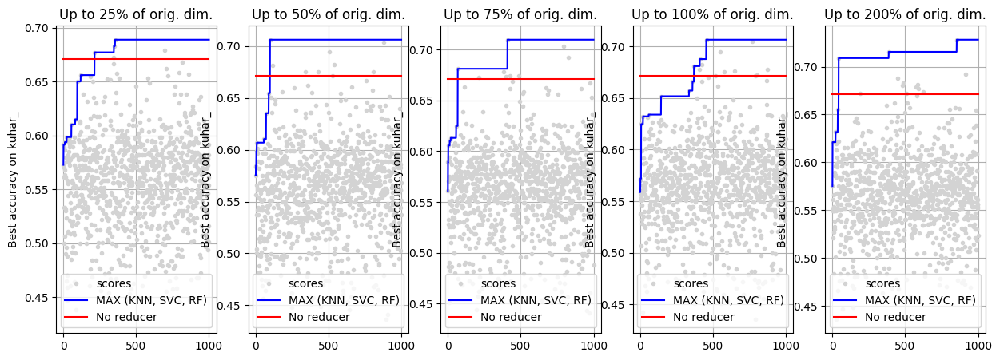

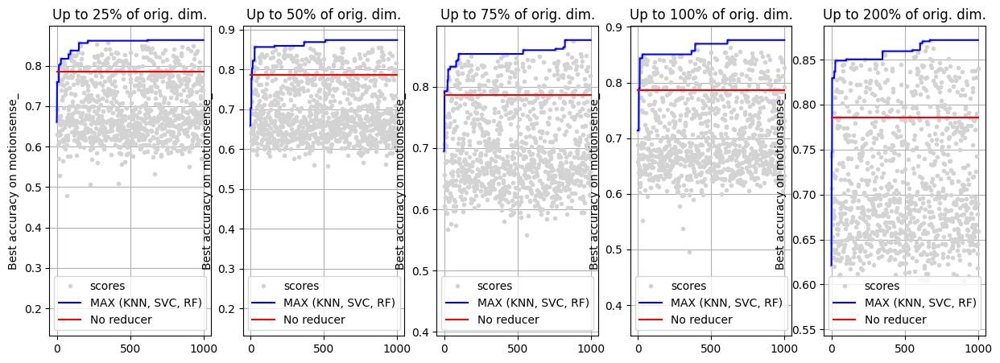

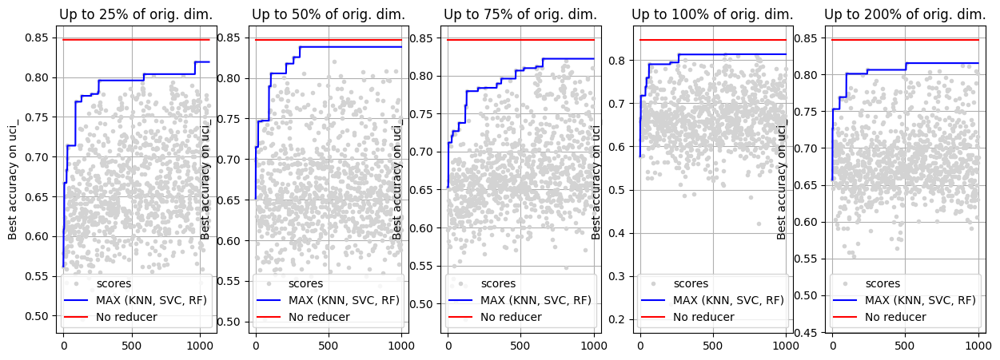

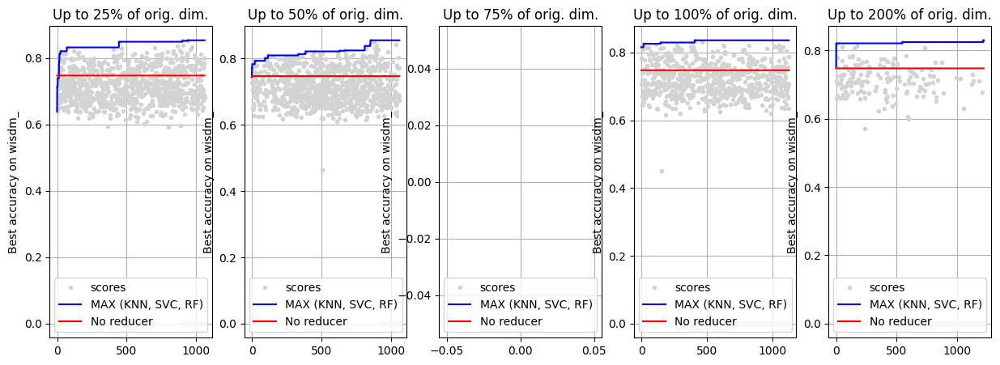

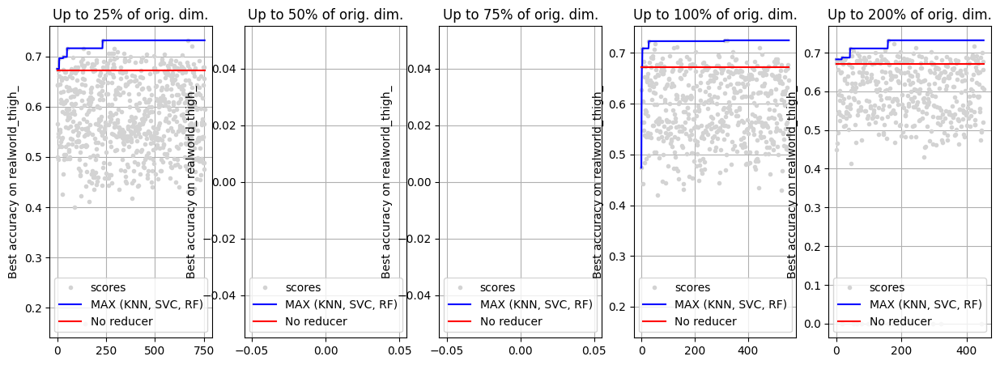

In [56]:
def get_perc(fig, axs, dataset, percentage, model, indice_plot):
    data = df[(df['dataset'] == dataset) & 
             (df['percentage'] == percentage) & 
             (df['model'] == model) ]
    score_no_reducer = get_no_reducer_score(dataset)
    
    axs[indice_plot].set_title(f'Up to {percentage}% of orig. dim.')
    axs[indice_plot].plot(data['Unnamed: 0'], data['score'], '.', color='lightgray', label='scores')
    axs[indice_plot].plot(data['Unnamed: 0'],data['score'].cummax(), color='blue', label='MAX (KNN, SVC, RF)')
    axs[indice_plot].plot(data['Unnamed: 0'], [score_no_reducer] * len(data), color='red', label='No reducer')
    axs[indice_plot].legend(loc='lower center')
    axs[indice_plot].set_ylabel(f'Best accuracy on {dataset}_')
    axs[indice_plot].grid()

def plot_all_perc(type_simclr):
    for i, dataset in enumerate(datasets):
        fig, axs = plt.subplots(1, 5, figsize=(15, 5))
    
        # Subplots for each dataset
        for j, percentage in enumerate(percentages):
            indice_plot = j  # Use j as the index for subplots
            get_perc(fig, axs, dataset, percentage, type_simclr, indice_plot)

plot_all_perc('simclr')


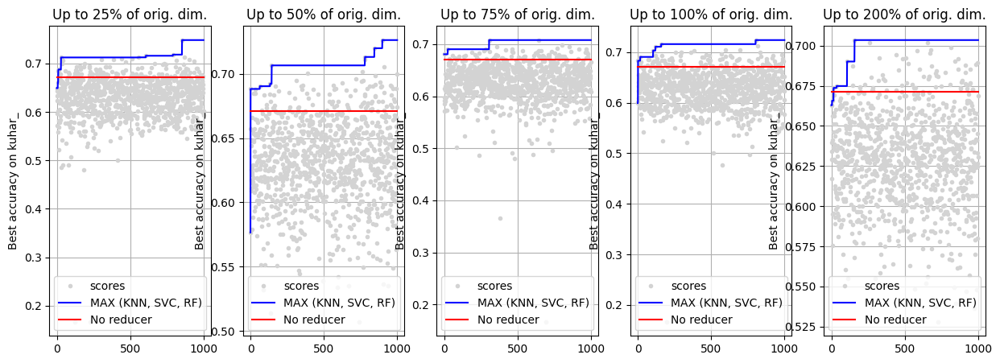

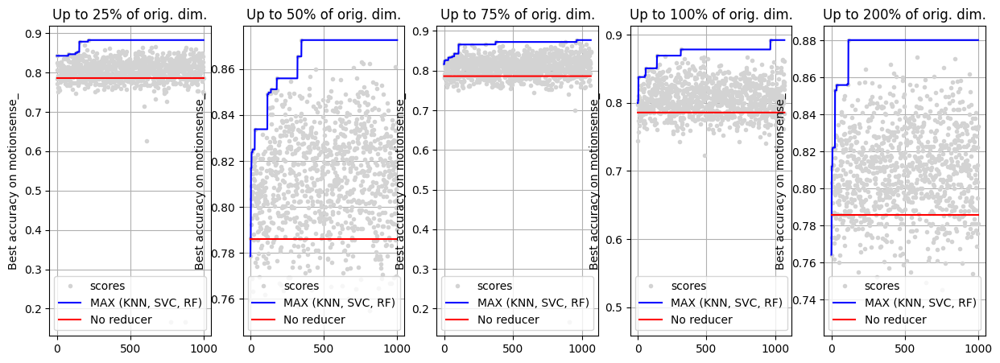

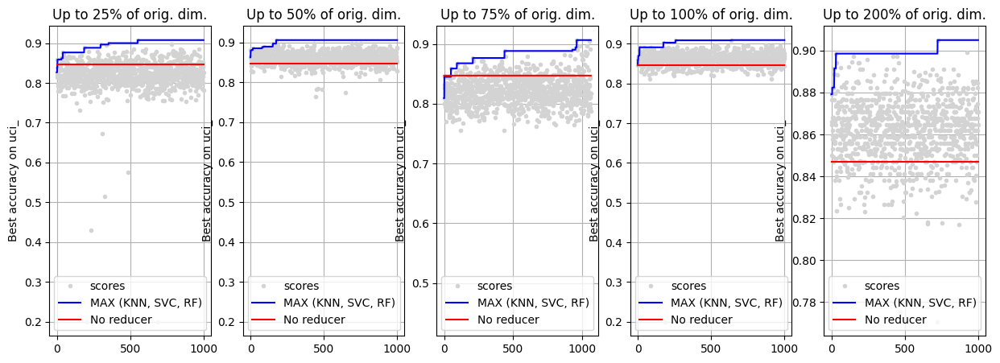

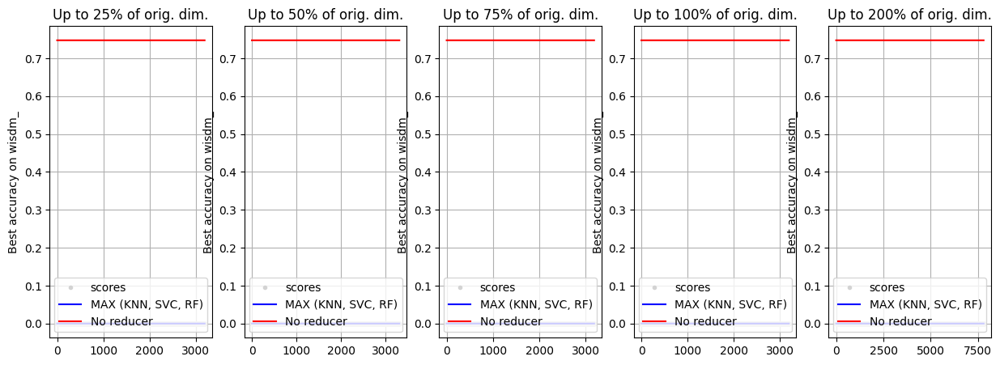

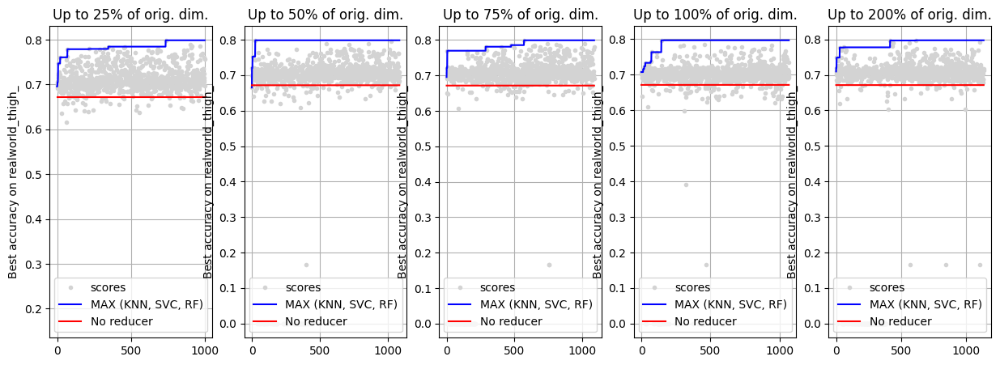

In [57]:
plot_all_perc('simclr_full')

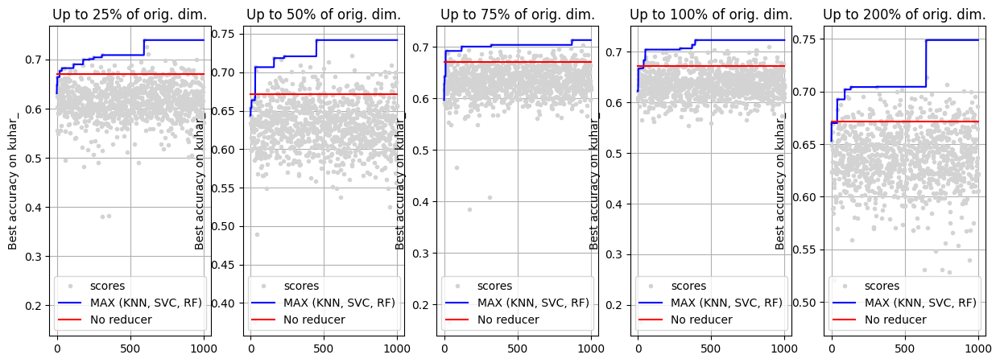

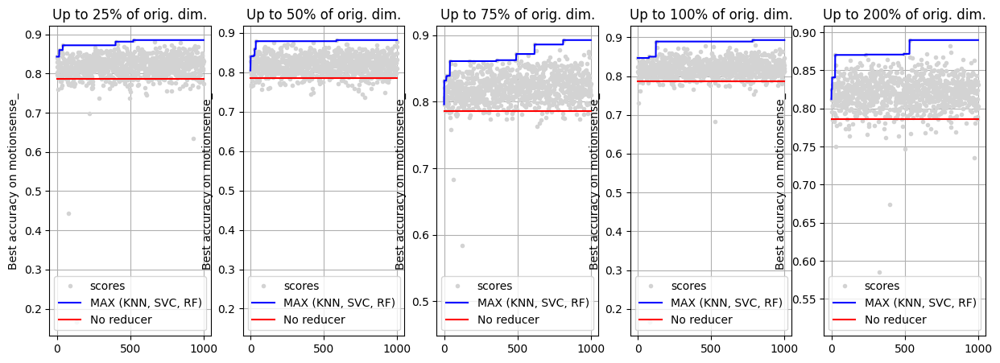

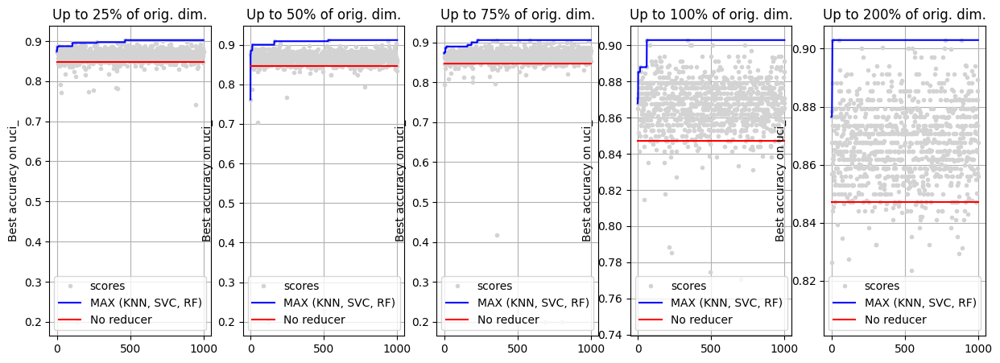

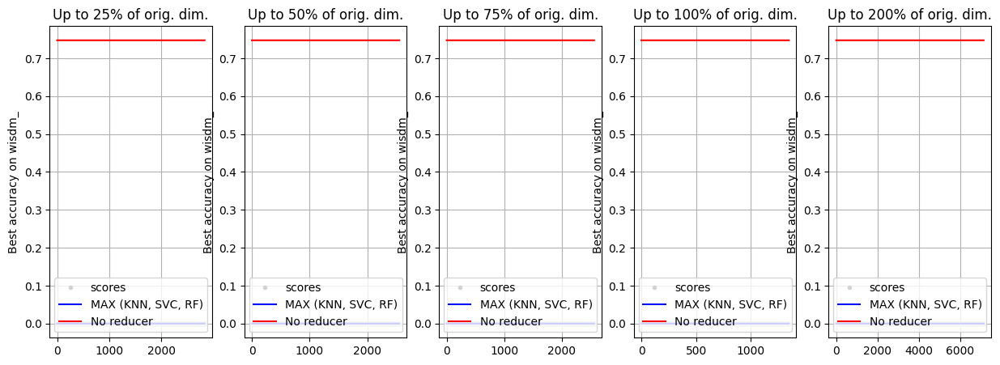

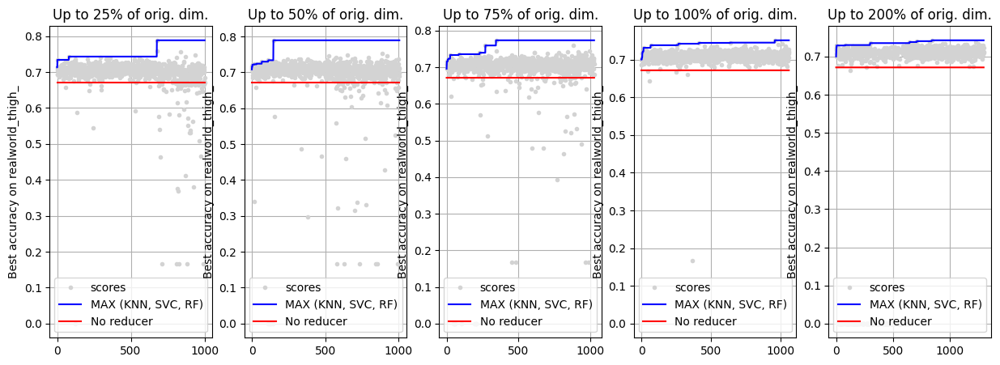

In [58]:
plot_all_perc('simclr_linear')

[[0.8191176470588235, 0.838235294117647, 0.8220588235294117, 0.8135294117647058, 0.8152941176470587], [0.9023529411764706, 0.9117647058823528, 0.9058823529411764, 0.9029411764705882, 0.9029411764705882], [0.9076470588235294, 0.9058823529411764, 0.906470588235294, 0.9094117647058824, 0.905]]


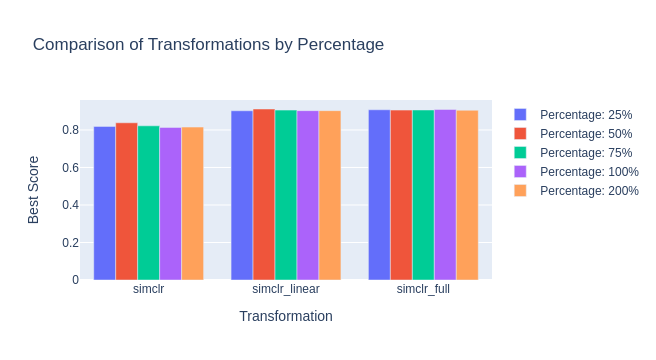

In [64]:
import plotly.graph_objects as go
import pandas as pd

def plot_bar_models_perc(dataset,models):
    best_scores = []
    
    for model in models:
        scores = []
        for percentage in percentages:
            try:
                data = df[(df['dataset'] == dataset) & 
             (df['percentage'] == percentage) & 
             (df['model'] == model) ]
                score_no_reducer=get_no_reducer_score(dataset)        
                data = data.loc[data['score'] > 0]
                scores.append(data['score'].max())
                

            except:
                scores.append(0)
        
        best_scores.append(scores)
    
    data = []
    for i, p in enumerate(percentages):
        scores_for_percentage = [scores[i] for scores in best_scores]
        trace = go.Bar(
            x=models,
            y=scores_for_percentage,
            name=f'Percentage: {p}%'
        )
        data.append(trace)
    
    print(best_scores)
    layout = go.Layout(
        title='Comparison of Transformations by Percentage',
        xaxis=dict(title='Transformation'),
        yaxis=dict(title='Best Score'),
        barmode='group'  
    )
    
    fig = go.Figure(data=data, layout=layout)
    fig.show()


plot_bar_models_perc('uci',models)

[[0.8191176470588235, 0.838235294117647, 0.8220588235294117, 0.8135294117647058, 0.8152941176470587], [0.9023529411764706, 0.9117647058823528, 0.9058823529411764, 0.9029411764705882, 0.9029411764705882], [0.9076470588235294, 0.9058823529411764, 0.906470588235294, 0.9094117647058824, 0.905]]


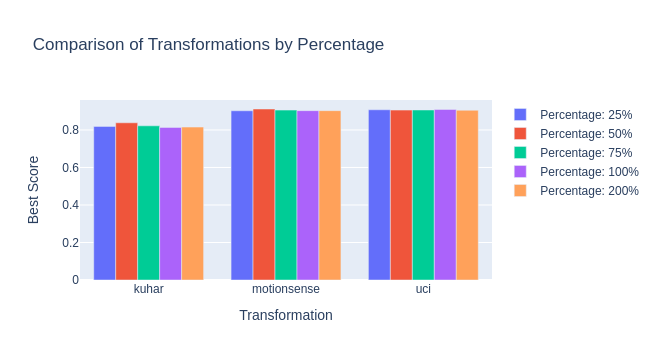

In [65]:
import plotly.graph_objects as go
import pandas as pd

def plot_bar_porcent_dataset(dataset,models):
    best_scores = []
    
    for model in models:
        scores = []
        for percentage in percentages:
            try:
                data = df[(df['dataset'] == dataset) & 
             (df['percentage'] == percentage) & 
             (df['model'] == model) ]
                score_no_reducer=get_no_reducer_score(dataset)        
                data = data.loc[data['score'] > 0]
                scores.append(data['score'].max())
                

            except:
                scores.append(0)
        
        best_scores.append(scores)
    
    data = []
    for i, p in enumerate(percentages):
        scores_for_percentage = [scores[i] for scores in best_scores]
        trace = go.Bar(
            x=datasets,
            y=scores_for_percentage,
            name=f'Percentage: {p}%'
        )
        data.append(trace)
    
    print(best_scores)
    layout = go.Layout(
        title='Comparison of Transformations by Percentage',
        xaxis=dict(title='Transformation'),
        yaxis=dict(title='Best Score'),
        barmode='group'  
    )
    
    fig = go.Figure(data=data, layout=layout)
    fig.show()


plot_bar_porcent_dataset('uci',models)